In [1]:
# Installing necessary packages
!pip install ta
!pip install mplfinance

  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.10.2-py3-none-any.whl size=29088 sha256=b2045e85dfbb2a06fc0e2a99d66ade2847f608a65e9f3e808e58fb9822a3c0db
  Stored in directory: /root/.cache/pip/wheels/47/51/06/380dc516ea78621870b93ff65527c251afdfdc5fa9d7f4d248
Successfully built ta
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 kB 3.0 MB/s eta 0:00:00


In [2]:
# Importing librarys
import matplotlib.pyplot as plt
import math
import pandas as pd
import numpy as np
import ta
from sklearn.cluster import KMeans
import mplfinance as mpf
from datetime import datetime, timedelta

In [4]:
# Load Gold H1 data
data = pd.read_csv('data.csv')

# Set date oclumn to datetime
data['Local time'] = pd.to_datetime(data['Local time'], format='%d.%m.%Y %H:%M:%S.%f GMT%z', utc=True)

# change local time name to date
data.rename(columns={'Local time': 'Date'}, inplace=True)

# set index to date
data.set_index('Date', inplace=True)

# drop rows with volume = 0
data = data[data['Volume'] != 0]

# print first 5 rows
print(len(data))
data.head()

31890


,Open,High,Low,Close,Volume
Date,,,,,
2018-01-01 23:00:00+00:00,1302.922,1307.602,1302.231,1306.711,1.626430e+06
2018-01-02 00:00:00+00:00,1306.711,1307.308,1305.211,1306.292,2.392190e+06
2018-01-02 01:00:00+00:00,1306.291,1306.952,1304.171,1306.141,2.997380e+06
2018-01-02 02:00:00+00:00,1306.142,1306.772,1305.418,1305.949,2.441420e+06
2018-01-02 03:00:00+00:00,1305.941,1307.422,1305.381,1306.438,2.557650e+06


In [5]:
def time_price_distance(v1, v2, t1, t2, atr):
    return abs(v2 - v1) / atr + abs(t2 - t1) / 4

In [6]:
def extract_async_peaks(data, left_alpha, right_alpha, atr_window, arrow_margin_plot_coef=0.5):
    # Intialize max_peaks and min_peaks with NaN
    max_peaks, min_peaks = [np.nan]*len(data), [np.nan]*len(data)

    # Extract local max peaks
    for i in range(atr_window, len(data)):
        atr = data['ATR'][i]
        is_max = True
        # Right side check
        for j in range(i+1, len(data)):
            if data['High'][j] > data['High'][i]:
                is_max = False
                break
            if time_price_distance(data['High'][i], data['Low'][j], i, j, atr) > right_alpha:
                break
        # Left side check
        if is_max:
            for j in range(i-1, 0, -1):
                if data['High'][j] > data['High'][i]:
                    is_max = False
                    break
                if time_price_distance(data['High'][i], data['Low'][j], i, j, atr) > left_alpha:
                    break
        if is_max:
            max_peaks[i] = data['High'][i] + arrow_margin_plot_coef * atr

    # Extract local min peaks
    for i in range(atr_window, len(data)):
        atr = data['ATR'][i]
        is_min = True
        # Right side check
        for j in range(i+1, len(data)):
            if data['Low'][j] < data['Low'][i]:
                is_min = False
                break
            if time_price_distance(data['Low'][i], data['High'][j], i, j, atr) > right_alpha:
                break
        # Left side check
        if is_min:
            for j in range(i-1, 0, -1):
                if data['Low'][j] < data['Low'][i]:
                    is_min = False
                    break
                if time_price_distance(data['Low'][i], data['High'][j], i, j, atr) > left_alpha:
                    break
        if is_min:
            min_peaks[i] = data['Low'][i] - arrow_margin_plot_coef * atr

    # remove peaks that are in a sequence
    for i in range(atr_window, len(data)):
        if not np.isnan(max_peaks[i]):
            # check for next peak (it sould be a min peak)
            for j in range(i+1, len(data)):
                if np.isnan(max_peaks[j]):
                    break
                if not np.isnan(max_peaks[j]):
                    max_peaks[j] = np.nan
        if not np.isnan(min_peaks[i]):
            # check for next peak (it sould be a max peak)
            for j in range(i+1, len(data)):
                if np.isnan(min_peaks[j]):
                    break
                if not np.isnan(min_peaks[j]):
                    min_peaks[j] = np.nan

    # remove peaks in a same candle
    for i in range(atr_window, len(data)):
        if not np.isnan(max_peaks[i]) and not np.isnan(min_peaks[i]):
            if data['Close'][i] > data['Open'][i]:
                min_peaks[i] = np.nan
            else:
                max_peaks[i] = np.nan

    return max_peaks, min_peaks

In [7]:
def extract_middle_paeks(data, alpha, atr_window, arrow_margin_plot_coef=0.5):
    # Intialize max_peaks and min_peaks with NaN
    max_middle_peaks, min_middle_peaks = extract_async_peaks(data, alpha, alpha, atr_window, arrow_margin_plot_coef=0.5)

    # fill between middle peaks
    for i in range(atr_window, len(data)):
        if not np.isnan(max_middle_peaks[i]):
            # check for next peak (it sould be a min peak)
            for j in range(i+1, len(data)):
                if not np.isnan(max_middle_peaks[j]):
                    # find min index between i and j
                    min_index = np.argmin(data['Low'][i+1:j]) + i+1
                    min_middle_peaks[min_index] = data['Low'][min_index] - arrow_margin_plot_coef * data['ATR'][min_index]
                    break
                if not np.isnan(min_middle_peaks[j]):
                    break
        if not np.isnan(min_middle_peaks[i]):
            # check for next peak (it sould be a max peak)
            for j in range(i+1, len(data)):
                if not np.isnan(min_middle_peaks[j]):
                    # find max index between i and j
                    max_index = np.argmax(data['High'][i+1:j]) + i+1
                    max_middle_peaks[max_index] = data['High'][max_index] + arrow_margin_plot_coef * data['ATR'][max_index]
                    break
                if not np.isnan(max_middle_peaks[j]):
                    break

    return max_middle_peaks, min_middle_peaks

In [8]:
def extract_list_of_lines(data):
    lines = []
    trends = []
    start_point, end_point = None, None
    trend = 'w'
    for i in range(len(data)):
        if not np.isnan(data['MaxMiddlePeaks'][i]):
            if end_point is not None:
                start_point = end_point
            end_point = (data.index[i], data['High'][i])
            if start_point is not None:
                lines.append([start_point, end_point])
                trends.append(trend)
        if not np.isnan(data['MinMiddlePeaks'][i]):
            if end_point is not None:
                start_point = end_point
            end_point = (data.index[i], data['Low'][i])
            if start_point is not None:
                lines.append([start_point, end_point])
                trends.append(trend)
        if not np.isnan(data['MaxPeaks'][i]):
            trend = 'b'
        elif not np.isnan(data['MinPeaks'][i]):
            trend = 'r'
    return lines, trends

In [9]:
atr_window = 200
left_alpha = 10
right_alpha = 2
arrow_margin_plot_coef = 0.5

data['ATR'] = ta.volatility.average_true_range(data['High'], data['Low'], data['Close'], window=atr_window, fillna=False)
data['MaxPeaks'], data['MinPeaks'] = extract_async_peaks(data, left_alpha, right_alpha, atr_window, arrow_margin_plot_coef)
data['MaxMiddlePeaks'], data['MinMiddlePeaks'] = extract_middle_paeks(data, right_alpha, atr_window, arrow_margin_plot_coef)

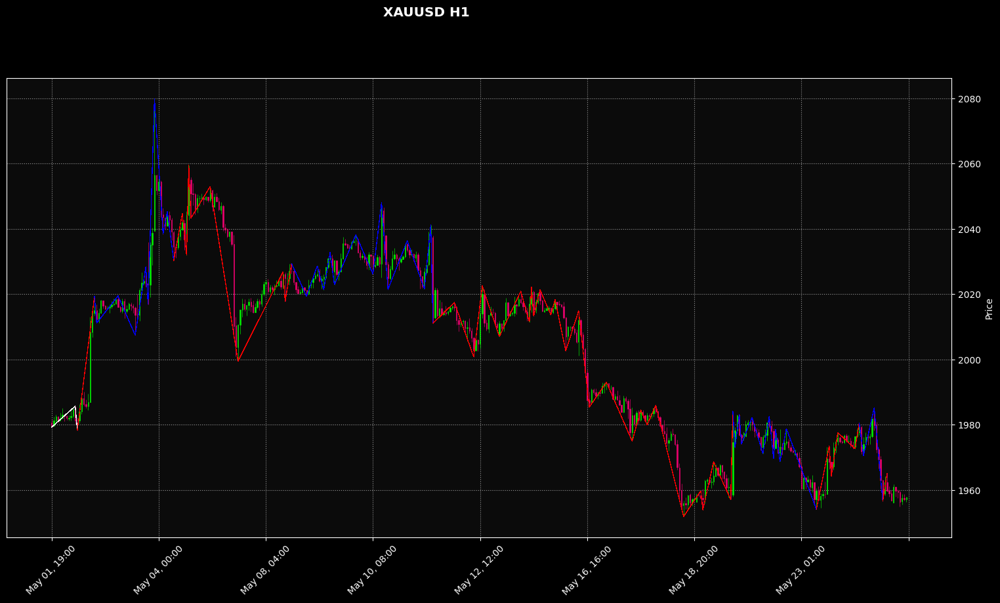

In [10]:
data_window = 400
strat_candle = 1

# ZigZag Lines
zigzag_lines, trends = extract_list_of_lines(data[-strat_candle-data_window:-strat_candle])

# create custom style
mc = mpf.make_marketcolors(up='#00ff00',down='#ff0077',inherit=True)
s = mpf.make_mpf_style(base_mpf_style='nightclouds', marketcolors=mc, gridstyle=':', y_on_right=True)
# plot candlestick chart
title = 'XAUUSD H1'
mpf.plot(data[-strat_candle-data_window:-strat_candle], type='candle', style=s, title=title, figsize=(20, 10), figscale=1,
          alines=dict(alines = zigzag_lines, colors = trends, linewidths=0.2))

In [11]:
for row in zigzag_lines:
    print(row)

[(Timestamp('2023-05-01 19:00:00+0000', tz='UTC'), 1979.235), (Timestamp('2023-05-02 07:00:00+0000', tz='UTC'), 1985.665)]
[(Timestamp('2023-05-02 07:00:00+0000', tz='UTC'), 1985.665), (Timestamp('2023-05-02 08:00:00+0000', tz='UTC'), 1978.324)]
[(Timestamp('2023-05-02 08:00:00+0000', tz='UTC'), 1978.324), (Timestamp('2023-05-02 16:00:00+0000', tz='UTC'), 2019.248)]
[(Timestamp('2023-05-02 16:00:00+0000', tz='UTC'), 2019.248), (Timestamp('2023-05-02 17:00:00+0000', tz='UTC'), 2011.115)]
[(Timestamp('2023-05-02 17:00:00+0000', tz='UTC'), 2011.115), (Timestamp('2023-05-03 04:00:00+0000', tz='UTC'), 2019.465)]
[(Timestamp('2023-05-03 04:00:00+0000', tz='UTC'), 2019.465), (Timestamp('2023-05-03 12:00:00+0000', tz='UTC'), 2007.414)]
[(Timestamp('2023-05-03 12:00:00+0000', tz='UTC'), 2007.414), (Timestamp('2023-05-03 17:00:00+0000', tz='UTC'), 2028.465)]
[(Timestamp('2023-05-03 17:00:00+0000', tz='UTC'), 2028.465), (Timestamp('2023-05-03 18:00:00+0000', tz='UTC'), 2016.905)]
[(Timestamp('202

In [12]:
# Iterate over each row in the original matrix
new_zigzag_lines=[]
for row in zigzag_lines:

  # Calculate the mean timestamp as the average of the two timestamps
  mean_x = row[0][0] + (row[1][0] - row[0][0]) / 2

  # Calculate the mean of price
  mean_y = (row[0][1] + row[1][1]) / 2

  # Add the mean point to the mean row
  new_zigzag_lines.append((mean_x, mean_y))

# Print the mean matrix
for row in new_zigzag_lines:
    print(row)

(Timestamp('2023-05-02 01:00:00+0000', tz='UTC'), 1982.4499999999998)
(Timestamp('2023-05-02 07:30:00+0000', tz='UTC'), 1981.9945)
(Timestamp('2023-05-02 12:00:00+0000', tz='UTC'), 1998.786)
(Timestamp('2023-05-02 16:30:00+0000', tz='UTC'), 2015.1815000000001)
(Timestamp('2023-05-02 22:30:00+0000', tz='UTC'), 2015.29)
(Timestamp('2023-05-03 08:00:00+0000', tz='UTC'), 2013.4395)
(Timestamp('2023-05-03 14:30:00+0000', tz='UTC'), 2017.9395)
(Timestamp('2023-05-03 17:30:00+0000', tz='UTC'), 2022.685)
(Timestamp('2023-05-03 20:00:00+0000', tz='UTC'), 2048.3415)
(Timestamp('2023-05-04 00:00:00+0000', tz='UTC'), 2059.0615)
(Timestamp('2023-05-04 03:00:00+0000', tz='UTC'), 2041.8400000000001)
(Timestamp('2023-05-04 05:30:00+0000', tz='UTC'), 2037.7745)
(Timestamp('2023-05-04 09:00:00+0000', tz='UTC'), 2037.474)
(Timestamp('2023-05-04 12:00:00+0000', tz='UTC'), 2038.319)
(Timestamp('2023-05-04 13:30:00+0000', tz='UTC'), 2045.7145)
(Timestamp('2023-05-04 14:30:00+0000', tz='UTC'), 2051.405)
(Tim

In [13]:
def extract_legs_with_trend(data):
    legs = []
    trends = []
    start_point, end_point = None, None
    trend = 'w'
    for i in range(len(data)):
        if not np.isnan(data['MaxMiddlePeaks'][i]):
            if end_point is not None:
                start_point = end_point
            end_point = (data.index[i], data['High'][i])
            if start_point is not None:
                legs.append([start_point, end_point])
                trends.append(trend)
        if not np.isnan(data['MinMiddlePeaks'][i]):
            if end_point is not None:
                start_point = end_point
            end_point = (data.index[i], data['Low'][i])
            if start_point is not None:
                legs.append([start_point, end_point])
                trends.append(trend)
        if not np.isnan(data['MaxPeaks'][i]):
            trend = 'b'
        elif not np.isnan(data['MinPeaks'][i]):
            trend = 'r'

    return legs, trends

In [14]:
def create_datasets(data, num_legs):
    legs, trends = extract_legs_with_trend(data)
    datasets = []
    for i in range(num_legs, len(legs)):
        dataset = []
        for j in range(i-num_legs, i):
            start_date, start_price = legs[j][0]
            end_date, end_price = legs[j][1]
            dataset.append([start_date.timestamp(), start_price])
            dataset.append([end_date.timestamp(), end_price])
        dataset.append([legs[i][0][0].timestamp(), legs[i][0][1]])
        dataset.append([legs[i][1][0].timestamp(), legs[i][1][1]])
        datasets.append(dataset)

    return datasets

In [15]:
# Create datasets containing 2, 3, and 4 legs
datasets_2_legs = create_datasets(data[-strat_candle-data_window:-strat_candle], 2)
datasets_3_legs = create_datasets(data[-strat_candle-data_window:-strat_candle], 3)
datasets_4_legs = create_datasets(data[-strat_candle-data_window:-strat_candle], 4)

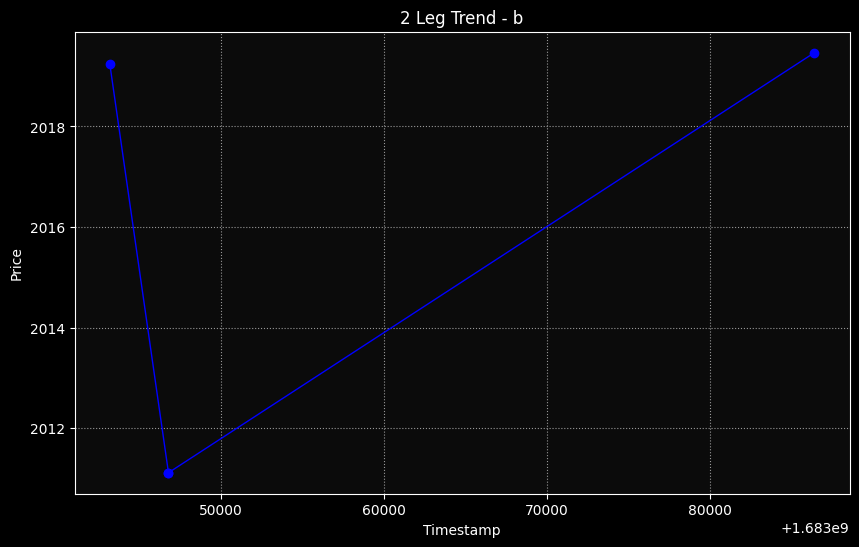

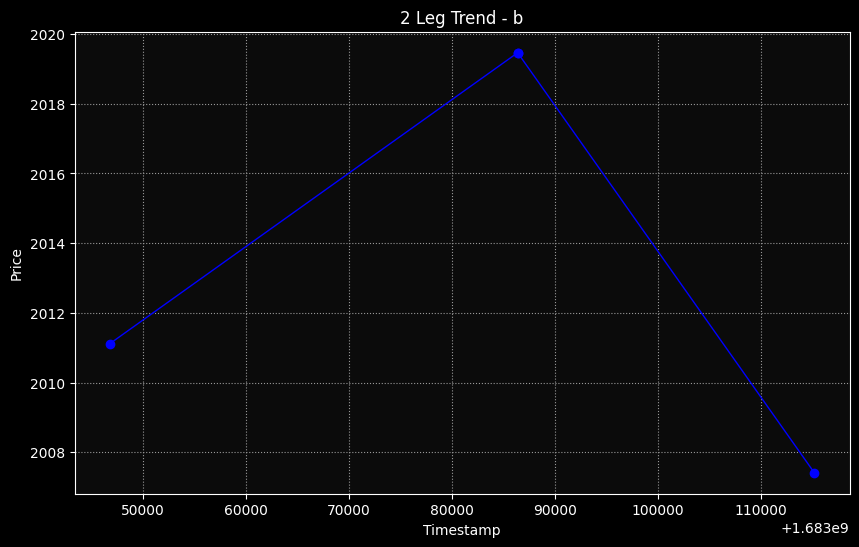

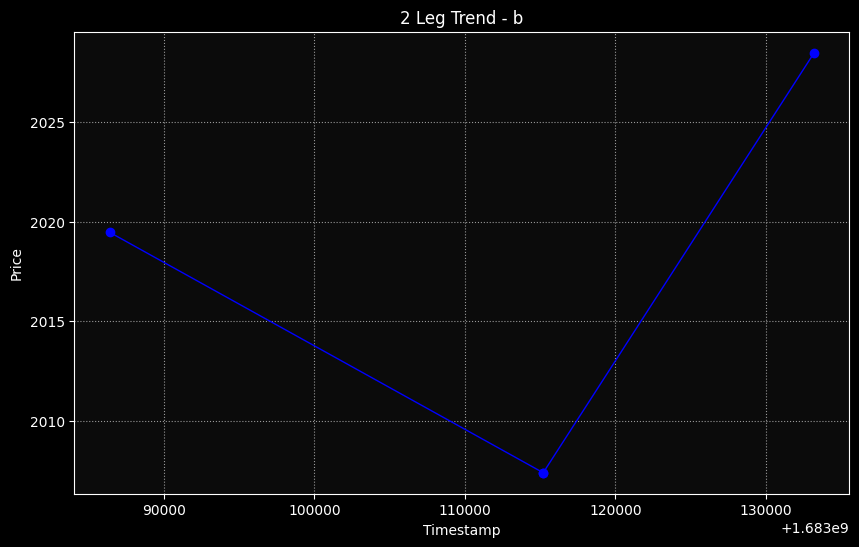

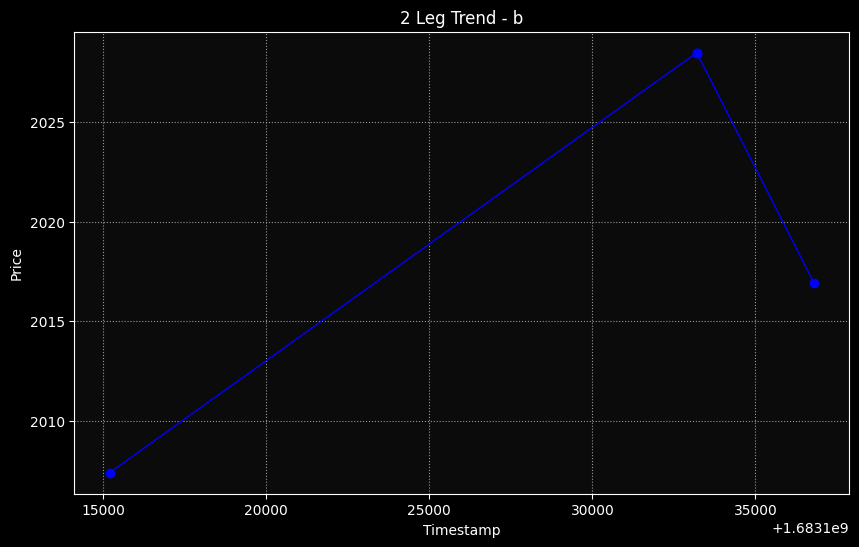

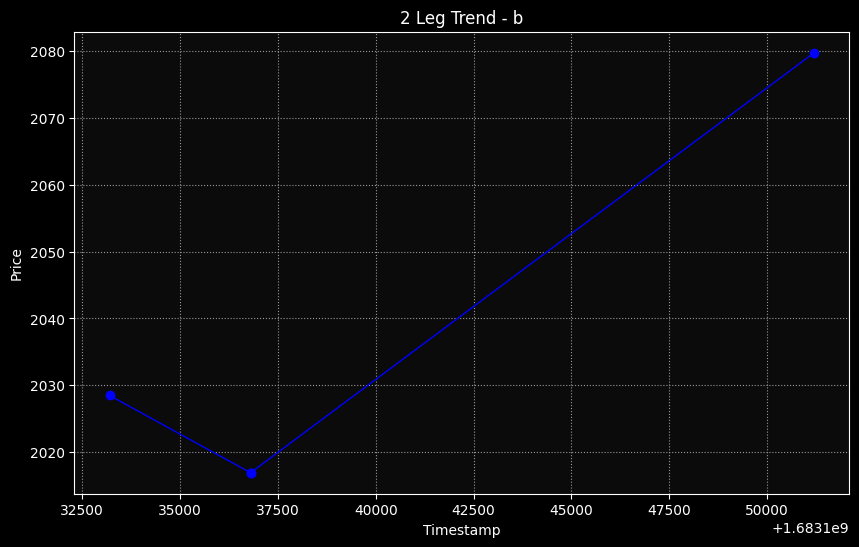

...

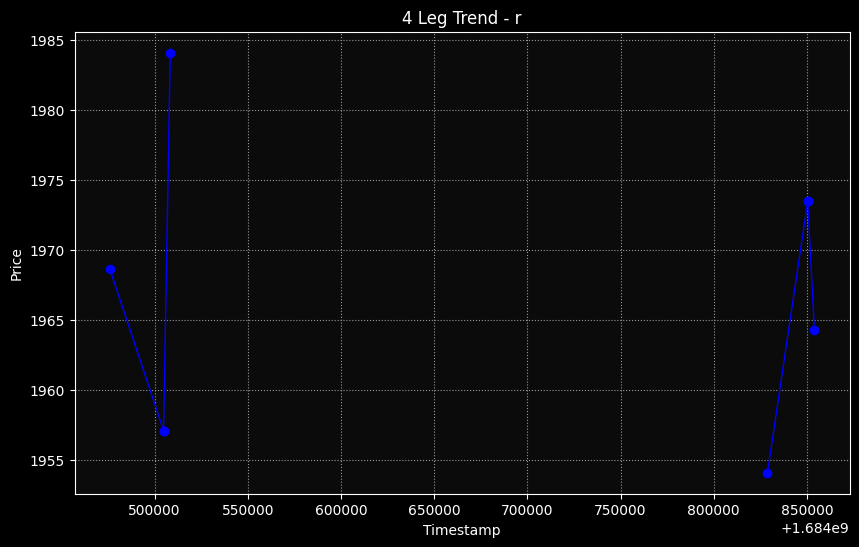

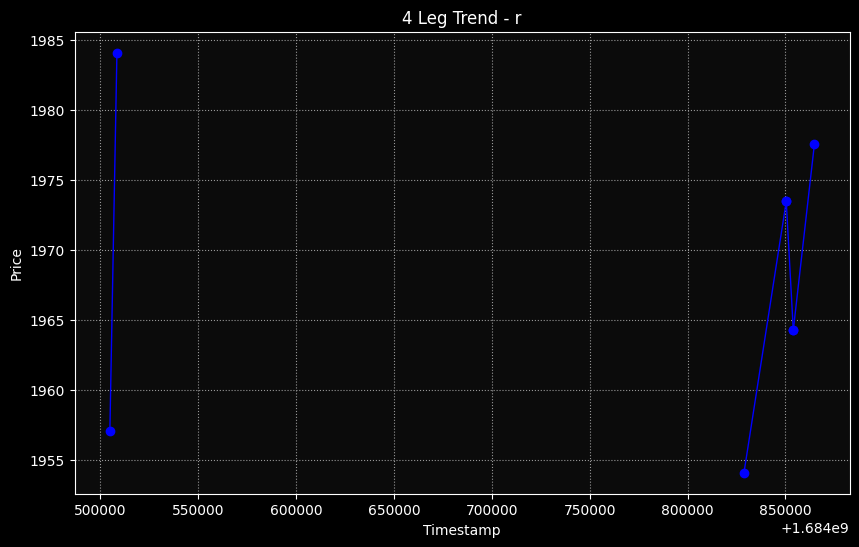

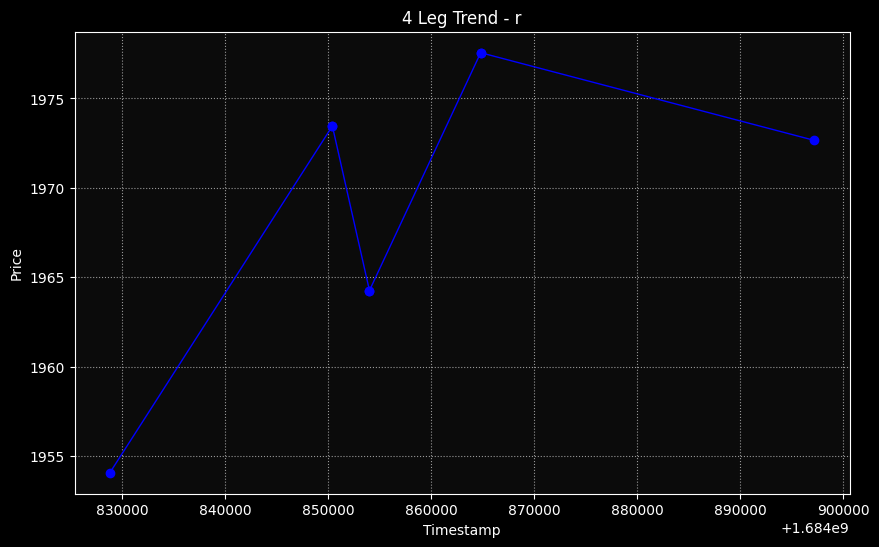

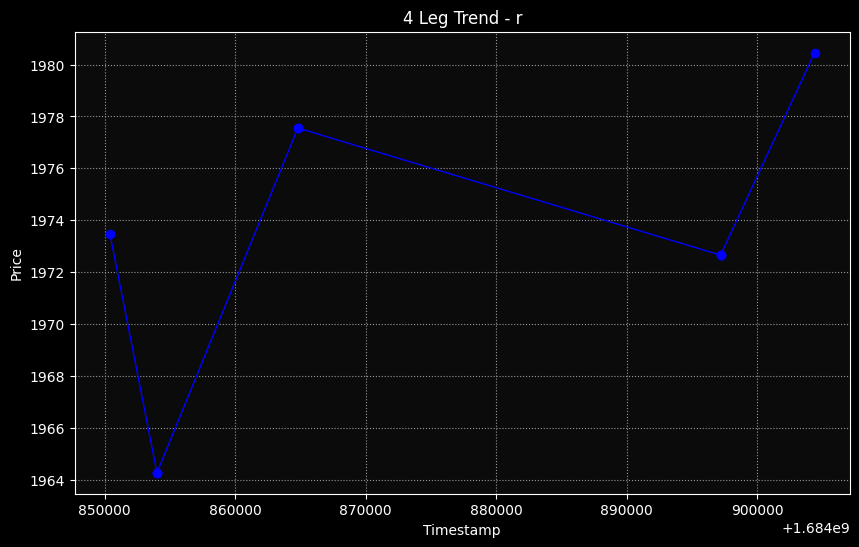

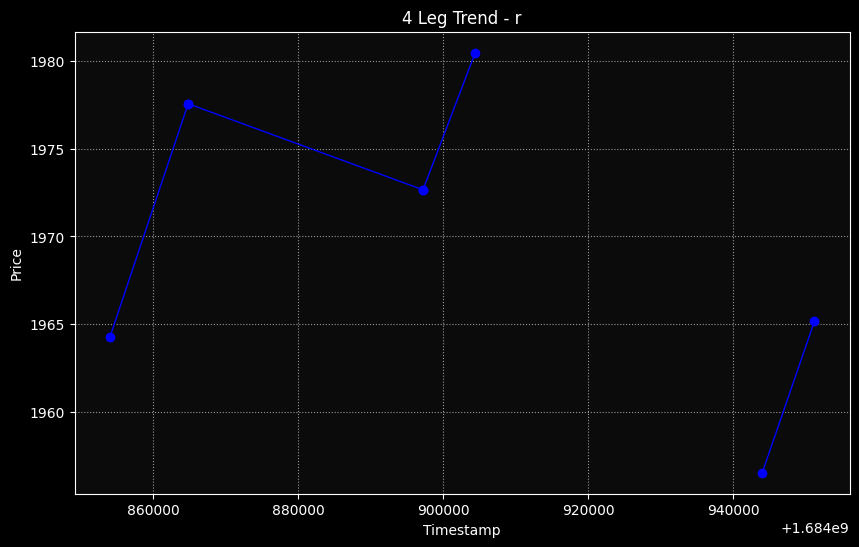

In [16]:
def plot_trends(legs, trends, num_legs):
    unique_trends = set(trends)
    for trend in unique_trends:
        trend_legs = [leg for leg, leg_trend in zip(legs, trends) if leg_trend == trend]
        num_plots = len(trend_legs) - num_legs + 1

        for i in range(num_plots):
            plt.figure(figsize=(10, 6))

            for j in range(i, i + num_legs):
                dataset = []
                leg = trend_legs[j]
                start_date, start_price = leg[0]
                end_date, end_price = leg[1]
                dataset.append([start_date.timestamp(), start_price])
                dataset.append([end_date.timestamp(), end_price])
                x = [data_point[0] for data_point in dataset]
                y = [data_point[1] for data_point in dataset]
                plt.plot(x, y, '-o', color='blue')

            plt.xlabel('Timestamp')
            plt.ylabel('Price')
            plt.title(f'{num_legs} Leg Trend - {trend}')
            plt.grid(True)
            plt.show()

legs, trends = extract_list_of_lines(data[-strat_candle-data_window:-strat_candle])

# Plot trends with 2 legs
plot_trends(legs, trends, 2)

# Plot trends with 3 legs
plot_trends(legs, trends, 3)

# Plot trends with 4 legs
plot_trends(legs, trends, 4)

In [17]:
def plot_patterns(patterns):
    num_patterns = len(patterns)
    num_plots = num_patterns // 9 + 1

    for plot_num in range(num_plots):
        plt.figure(figsize=(10,10))
        start_idx = plot_num * 9
        end_idx = (plot_num + 1) * 9

        for idx, pattern in enumerate(patterns[start_idx:end_idx]):
            ax = plt.subplot(3, 3, idx + 1)
            ax.plot(pattern)
            ax.set_title(f'Pattern {idx + 1}')
            ax.grid(True)

        plt.tight_layout()
        plt.show()

In [18]:
def run_kmeans(data, num_clusters):
    if len(data) < num_clusters:
        return []
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    kmeans.fit(data)
    return kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


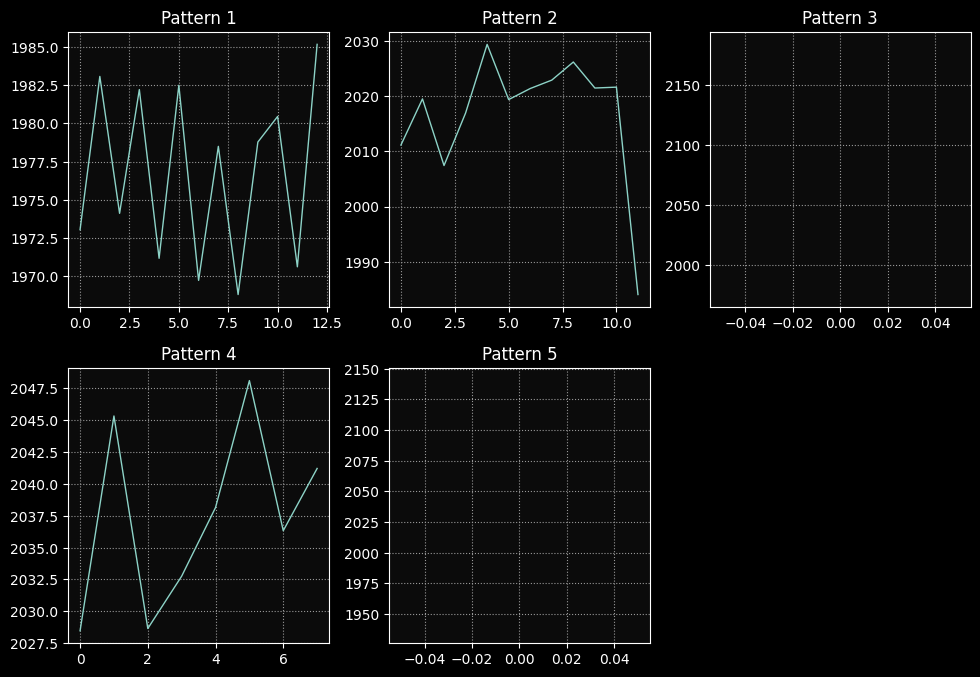

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


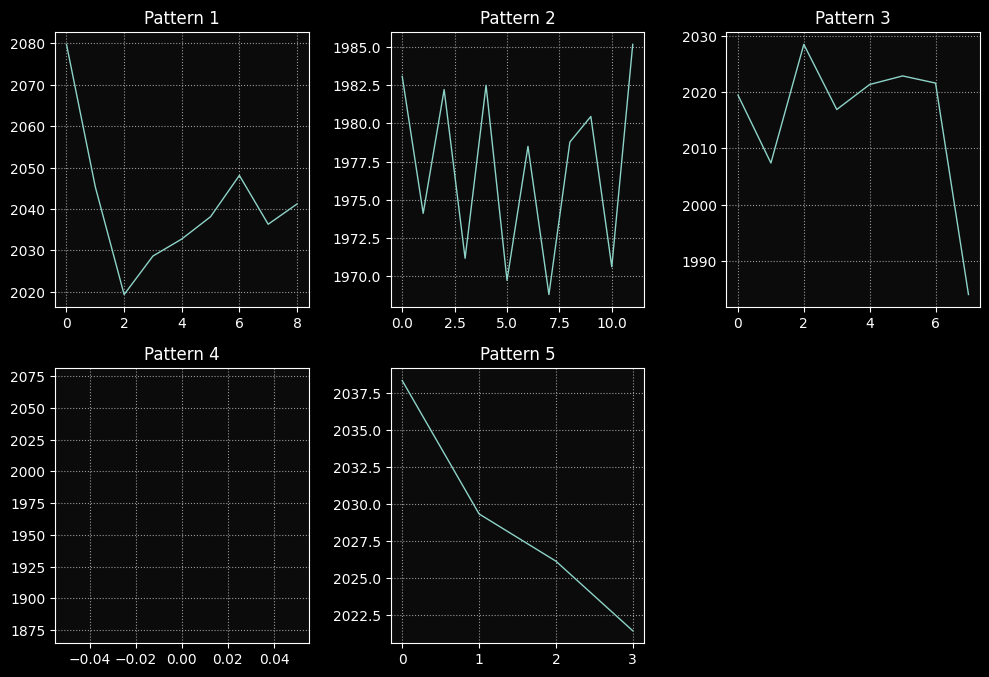

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


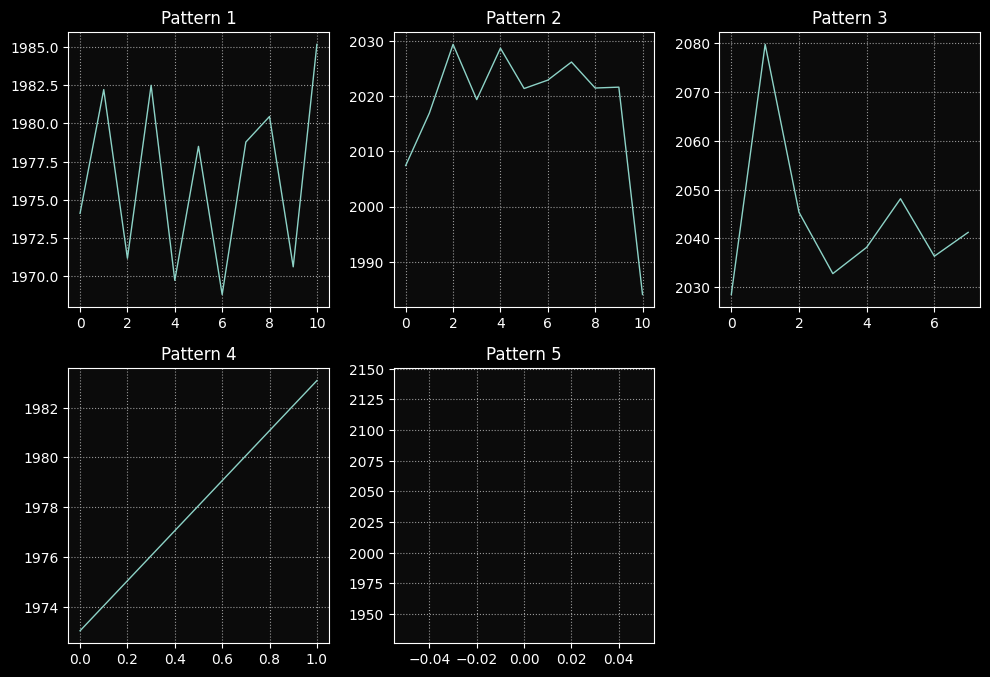

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


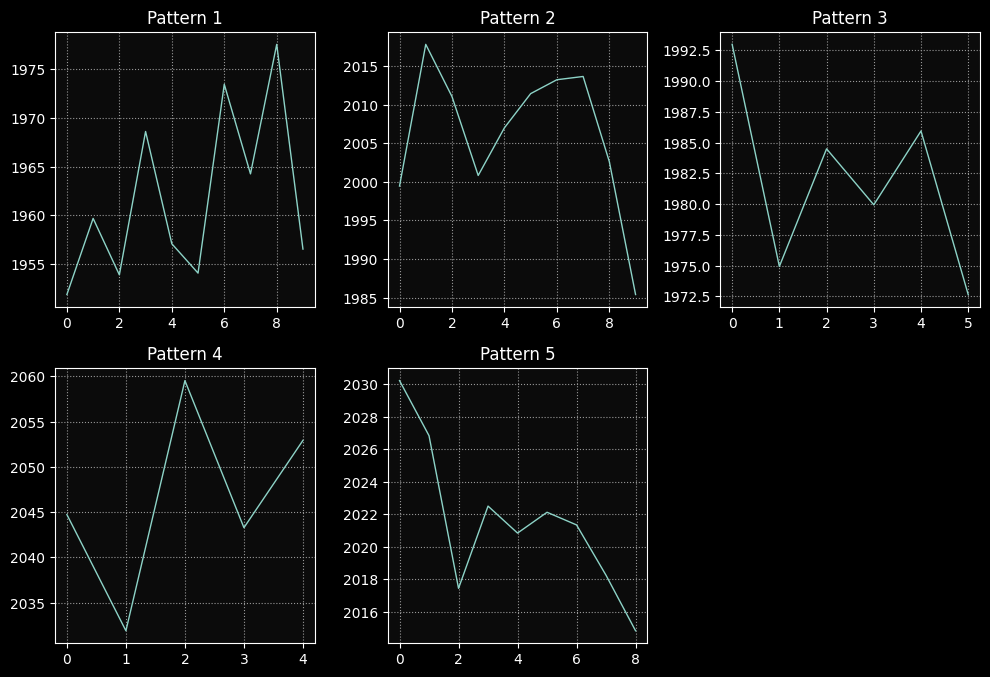

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


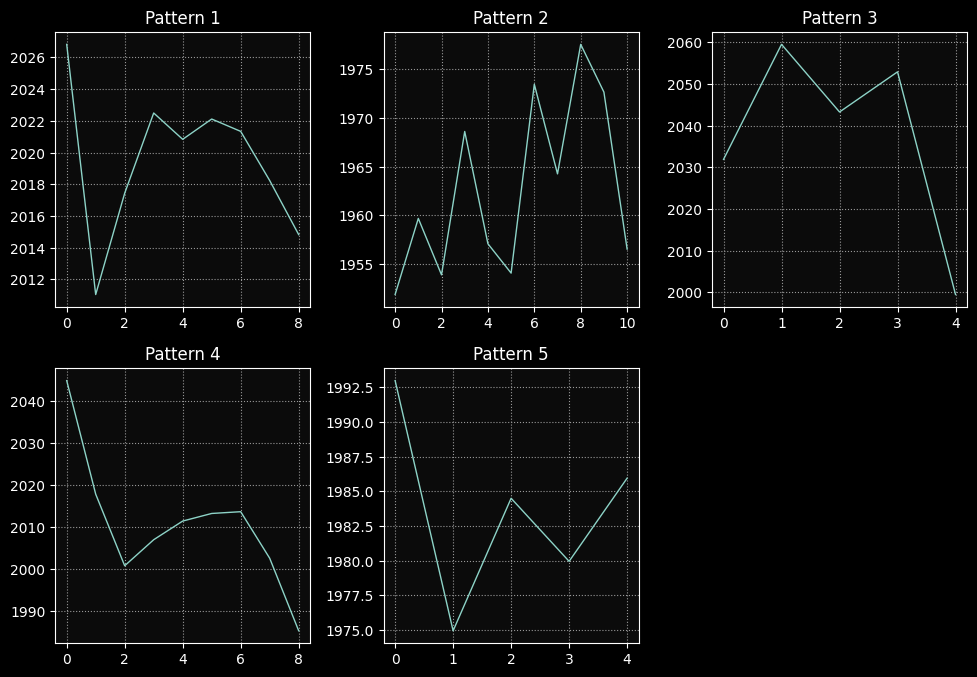

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


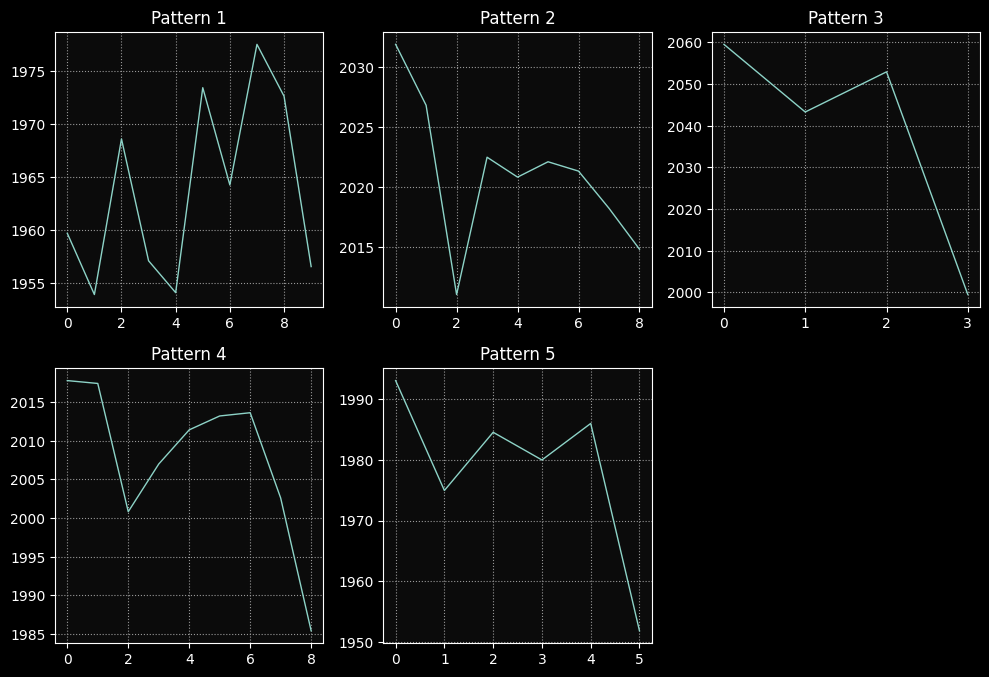

<Figure size 1000x1000 with 0 Axes>

In [19]:
# Split data for each trend
trend_labels = set(trends)

for trend in trend_labels:
    trend_data = [leg for leg, leg_trend in zip(legs, trends) if leg_trend == trend]
    num_legs = len(trend_data)

    # Create dataset for the specified number of legs
    if num_legs >= 2:
        dataset_2_legs = []
        for i in range(num_legs - 1):
            dataset_2_legs.append([trend_data[i][0][1], trend_data[i + 1][0][1]])

        # Run K-means algorithm for 2-leg dataset
        labels_2_legs = run_kmeans(dataset_2_legs, num_clusters=5)
        unique_labels = set(labels_2_legs)

        # Plot patterns for 2-leg dataset
        patterns_2_legs = []
        for label in unique_labels:
            pattern = np.array([dataset_2_legs[i][1] for i in range(len(dataset_2_legs)) if labels_2_legs[i] == label])
            patterns_2_legs.append(pattern)

        plot_patterns(patterns_2_legs)

    if num_legs >= 3:
        dataset_3_legs = []
        for i in range(num_legs - 2):
            dataset_3_legs.append([trend_data[i][0][1], trend_data[i + 1][0][1], trend_data[i + 2][0][1]])

        # Run K-means algorithm for 3-leg dataset
        labels_3_legs = run_kmeans(dataset_3_legs, num_clusters=5)
        unique_labels = set(labels_3_legs)

        # Plot patterns for 3-leg dataset
        patterns_3_legs = []
        for label in unique_labels:
            pattern = np.array([dataset_3_legs[i][2] for i in range(len(dataset_3_legs)) if labels_3_legs[i] == label])
            patterns_3_legs.append(pattern)

        plot_patterns(patterns_3_legs)

    if num_legs >= 4:
        dataset_4_legs = []
        for i in range(num_legs - 3):
            dataset_4_legs.append([trend_data[i][0][1], trend_data[i + 1][0][1], trend_data[i + 2][0][1], trend_data[i + 3][0][1]])

        # Run K-means algorithm for 4-leg dataset
        labels_4_legs = run_kmeans(dataset_4_legs, num_clusters=5)
        unique_labels = set(labels_4_legs)

        # Plot patterns for 4-leg dataset
        patterns_4_legs = []
        for label in unique_labels:
            pattern = np.array([dataset_4_legs[i][3] for i in range(len(dataset_4_legs)) if labels_4_legs[i] == label])
            patterns_4_legs.append(pattern)

        plot_patterns(patterns_4_legs)

In [20]:
def plot_patterns(patterns):
    num_patterns = len(patterns)
    num_plots = num_patterns // 9 + 1

    for plot_num in range(num_plots):
        start_idx = plot_num * 9
        end_idx = (plot_num + 1) * 9

        fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))

        for idx, pattern in enumerate(patterns[start_idx:end_idx]):
            row = idx // 3
            col = idx % 3
            ax = axes[row, col]
            ax.plot(pattern)
            ax.set_title(f'Pattern {idx + 1}')
            ax.grid(True)

        plt.tight_layout()
        plt.show()


In [21]:
def plot_centers_movement(centers):
    x = [center[0] for center in centers]
    y = [center[1] for center in centers]

    plt.figure(figsize=(8, 6))
    plt.plot(x, y, marker='o', linestyle='-', markersize=8)
    plt.xlabel('Center X')
    plt.ylabel('Center Y')
    plt.title('Centers Movement')
    plt.grid(True)
    plt.show()


In [22]:
def run_kmeans_detail(data, num_clusters):
  if len(data) < num_clusters:
    return []
  kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(data)
  labels = kmeans.labels_
  centers = kmeans.cluster_centers_
  centroid_movements = kmeans.cluster_centers_

  return labels, centers, centroid_movements

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


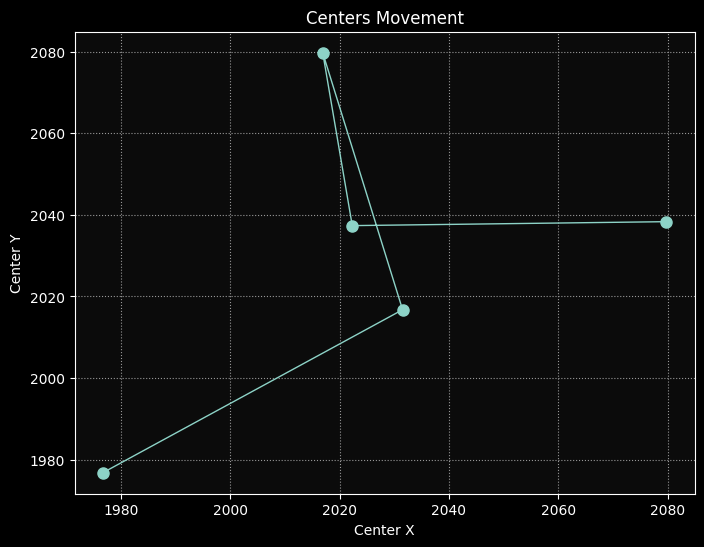

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


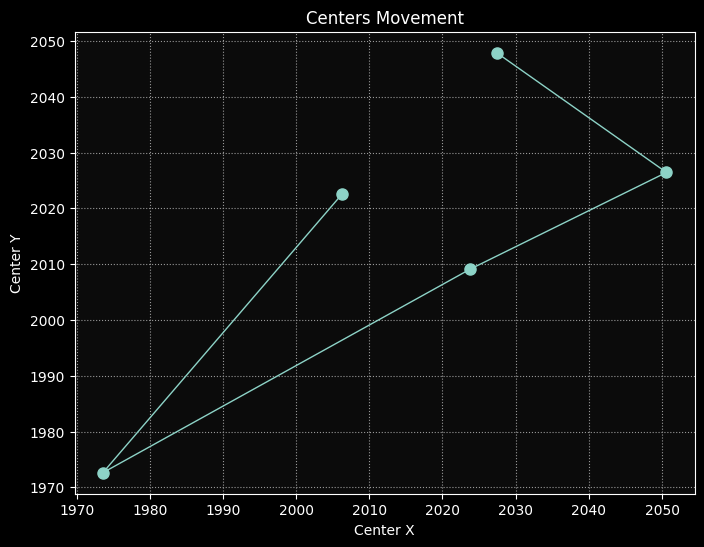

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


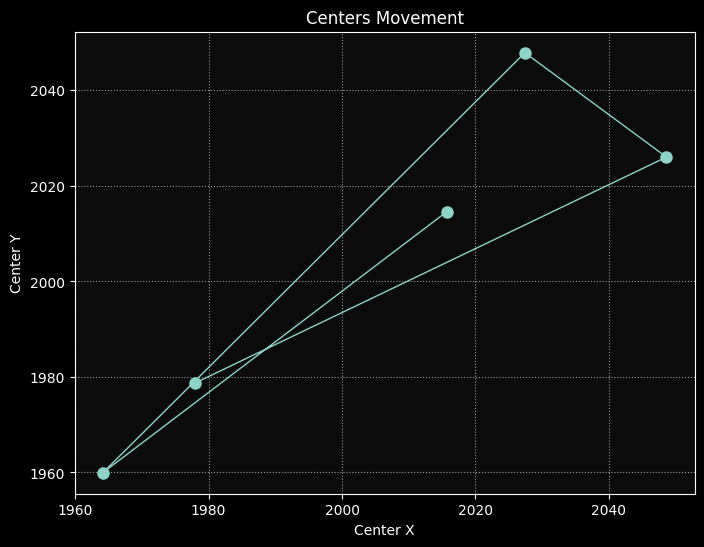

In [59]:
# Split data for each trend
trend_labels = set(trends)
plot_count = 0

dataset_2_legs = []

for trend in trend_labels:
    trend_data = [leg for leg, leg_trend in zip(legs, trends) if leg_trend == trend]
    num_legs = len(trend_data)

    for i in range(num_legs - 1):
        dataset_2_legs.append([trend_data[i][0][1], trend_data[i + 1][0][1]])

    labels_2_legs, centers_2_legs, centroid_movements = run_kmeans_detail(dataset_2_legs, num_clusters=5)

    if labels_2_legs is not None:
            # Plot centers' movement for 2-leg dataset
            plot_centers_movement(centers_2_legs)

In [53]:
def find_best_k(data, max_clusters):
    inertias = []
    for k in range(1, max_clusters+1):
      kmeans = KMeans(n_clusters=k, random_state=0)
      kmeans.fit(data)
      inertias.append(kmeans.inertia_)
    # Plot the inertias
    plt.plot(range(1, max_clusters+1), inertias)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method')
    plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

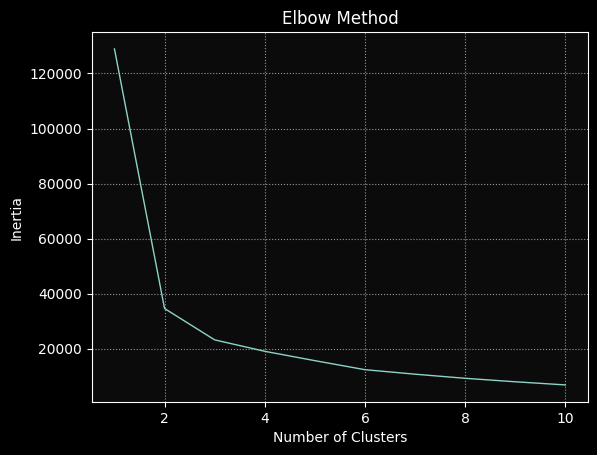

In [55]:
# Determine the best hyperparameter using the elbow method
find_best_k(dataset_2_legs,10)

In [63]:
def plot_patterns1(patterns):
    num_patterns = len(patterns)
    num_plots = num_patterns // 9 + 1

    for plot_num in range(num_plots):
        plt.figure(figsize=(10,10))
        start_idx = plot_num * 9
        end_idx = (plot_num + 1) * 9

        for idx, pattern in enumerate(patterns[start_idx:end_idx]):
            ax = plt.subplot(3, 3, idx + 1)
            ax.plot(pattern)
            ax.set_title(f'Pattern {idx + 1}')
            ax.grid(True)

        plt.tight_layout()
        plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


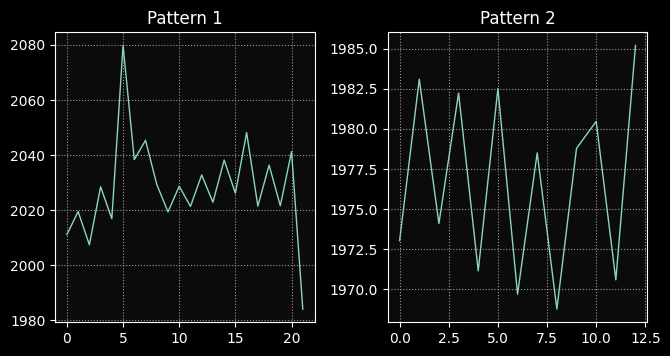

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


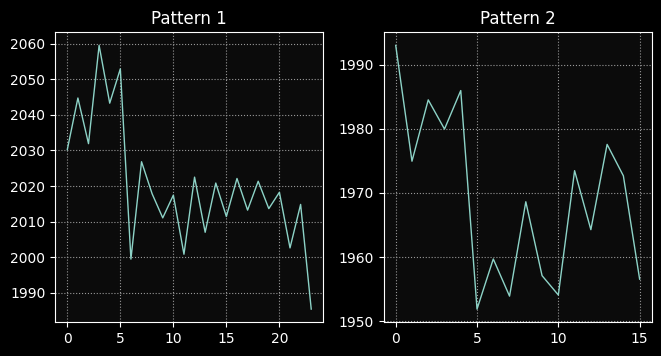

<Figure size 1000x1000 with 0 Axes>

In [65]:
# Split data for each trend
trend_labels = set(trends)

for trend in trend_labels:
    trend_data = [leg for leg, leg_trend in zip(legs, trends) if leg_trend == trend]
    num_legs = len(trend_data)

    dataset_2_legs = []
    for i in range(num_legs - 1):
        dataset_2_legs.append([trend_data[i][0][1], trend_data[i + 1][0][1]])

    # Run K-means algorithm for 2-leg dataset
    labels_2_legs = run_kmeans(dataset_2_legs, num_clusters=2)
    unique_labels = set(labels_2_legs)

    # Plot patterns for 2-leg dataset
    patterns_2_legs = []
    for label in unique_labels:
        pattern = np.array([dataset_2_legs[i][1] for i in range(len(dataset_2_legs)) if labels_2_legs[i] == label])
        patterns_2_legs.append(pattern)

    plot_patterns1(patterns_2_legs)